In [1]:
import datasets, utils, onsets as ons
import matplotlib.pyplot as plt, IPython.display as ipd
import mir_eval, librosa

Exception ignored on calling ctypes callback function: <function ExecutionEngine._raw_object_cache_notify at 0x00000210D65D9700>
Traceback (most recent call last):
  File "E:\Documents\Personal\WorkSpace\Research\ComplexDODF\venv\lib\site-packages\llvmlite\binding\executionengine.py", line 171, in _raw_object_cache_notify
    def _raw_object_cache_notify(self, data):
KeyboardInterrupt: 


In [2]:
music_net = datasets.MusicNet()
keys = music_net.get_keys()

In [3]:
def test_music_net_with_key(key, start, stop, plot=True):
    example_key = key
    piece = music_net.get_piece(example_key)
    wave, onsets, sr = piece.get_data()
    ran = slice(start*sr, stop*sr)
    if plot:
        utils.plot_wave(wave[ran])
        utils.plot_music_net_roll(piece.get_raw_labels(), sr, start=start, end=stop)
    onsets_second = librosa.samples_to_time(onsets, sr)
    clicks = mir_eval.sonify.clicks(onsets_second, sr, length=stop*sr)
    with_clicks = wave[ran] + clicks[ran]
    return with_clicks, sr

# MusicNet dataset preview

https://homes.cs.washington.edu/~thickstn/musicnet.html

6つの曲の15~30秒間のオンセットラベルのプレビュー．

15-20second preview of first 6 recordings with onset labels

key#5 (1818) is labeled ok-ish

key#0 is poorly labeled

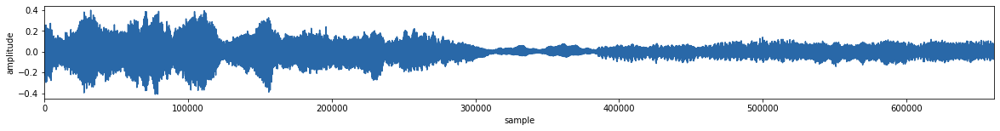

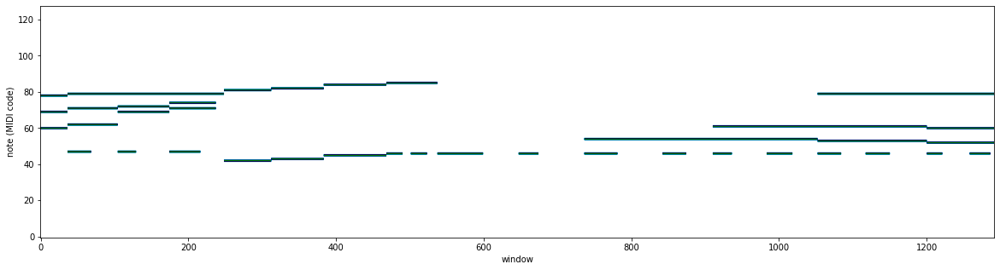

In [4]:
wav, sr = test_music_net_with_key(keys[0], 15, 30, plot=True)
ipd.Audio(wav, rate=sr)

In [5]:
wav, sr = test_music_net_with_key(keys[1], 15, 30, plot=False)
ipd.Audio(wav, rate=sr)

In [6]:
wav, sr = test_music_net_with_key(keys[2], 15, 30, plot=False)
ipd.Audio(wav, rate=sr)

In [7]:
wav, sr = test_music_net_with_key(keys[3], 15, 30, plot=False)
ipd.Audio(wav, rate=sr)

In [8]:
wav, sr = test_music_net_with_key(keys[4], 15, 30, plot=False)
ipd.Audio(wav, rate=sr)

In [9]:
wav, sr = test_music_net_with_key(keys[5], 15, 30, plot=False)
ipd.Audio(wav, rate=sr)

# Modal dataset preview

Modalはかなり小さいDatasetであり，単音やシンプルな5秒ほどの音源などと正確なオンセットが含まれている．

Modal dataset is very small, containing mostly single tone or 5~ seconds' recordings with precise onset position informations.

In [10]:
modal = datasets.Modal()
modal_keys = modal.get_keys()

In [11]:
def test_modal_with_key(key):
    example_key = key
    piece = modal.get_piece(example_key)
    wave, onsets, sr = piece.get_data()
    utils.plot_wave(wave)
    onsets_second = librosa.samples_to_time(onsets, sr)
    clicks = mir_eval.sonify.clicks(onsets_second, sr, length=len(wave))
    with_clicks = wave + clicks
    return with_clicks, sr

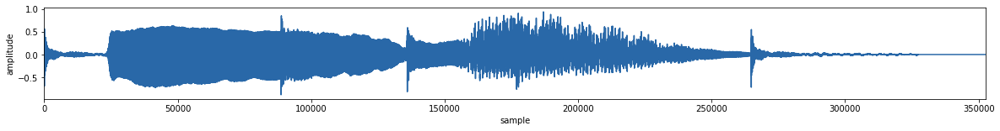

In [12]:
wav, sr = test_modal_with_key('mix2.wav')
ipd.Audio(wav, rate=sr)

# Boeck dataset preview
Boeck dataset はBoeckさんが多くのオンセット検出の論文で使っていたデータ集です

In [13]:
bock = datasets.BockSet()
bock_keys = bock.get_split(0)

def test_bock_with_key(key):
    piece = bock.get_piece(key)
    wave, onsets, sr = piece.get_data()
    utils.plot_wave(wave)
    onset_seconds = piece.get_onsets_seconds()
    clicks = mir_eval.sonify.clicks(onset_seconds, sr, length=len(wave))
    return (wave+clicks), sr

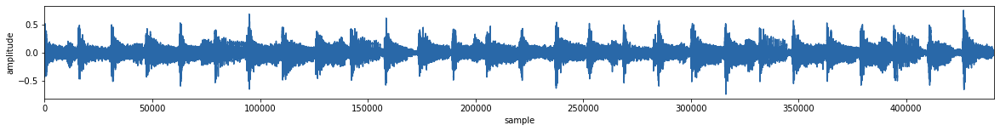

In [14]:
wave, sr = test_bock_with_key('al_Media-103611(8.2-18.2)')
ipd.Audio(wave, rate=sr)